# Spike sorting and pre-processing e-phys data
 
The following notebook is meant to introduce kilosort spike-sorting using mEC data as a reference.

Here we will be performing basic sanity-checks and we'll also be getting to know the functions required for pre-processing data en-masse.

It is recommended to go through this notebook before processing all your data.

In [ ]:
## Setup block ##
import os 
import json
import pandas as pd
import numpy as np
from pathlib import Path
#for plotting cluster reports
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display 


CODE_DIRECTORY = '/ceph/behrens/peter_doohan/goalNav_mEC/experiment/code' #containing SpikeSorting folder
os.chdir(CODE_DIRECTORY)

#import probe interface

#import custom scripts
import SpikeSorting.spikesort_session as sps 
import SpikeSorting.optimise_kilosort as ok
import SpikeSorting.unit_matching as um

# For development:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1. Data structure

We're expecting data which is structured as follows:
```Python
.
└── Experiment/ 
    ├── Code/ 
    │   └── ... <-- (you are somewhere here)
    └── Data/ 
        ├── ... 
        ├── raw_data/
        │   ├── ...
        │   └── ephys/
        │       └── [subject_ID]/
        │           └── [datetime]/
        │               └── [Open Ephys data]...
        └── preprocessed_data/
            ├── ...
            └── spikesorting
                └── [subject_ID]/
                    └── ...
```
One way to check that we're doing this is right is to generate a dataframe with all the path information required for preprocessing. This will also check that our files are readable (which can take a while). 

In [5]:
ephys_paths_df = sps.get_ephys_paths_df()
ephys_paths_df


,subject_ID,datetime,ephys_path,spike_sorting_completed,spike_interface_readable,duration_min
0,mEC_2,2024-04-02 10:28:21,../data/raw_data/ephys/mEC_2/2024-04-02_10-28-21,True,True,40.232016
1,mEC_2,2024-02-21 10:41:03,../data/raw_data/ephys/mEC_2/2024-02-21_10-41-03,True,True,40.730847
2,mEC_2,2024-04-01 11:16:12,../data/raw_data/ephys/mEC_2/2024-04-01_11-16-12,True,True,40.145527
3,mEC_2,2024-03-13 11:16:28,../data/raw_data/ephys/mEC_2/2024-03-13_11-16-28,True,True,30.223200
4,mEC_2,2024-03-18 11:13:56,../data/raw_data/ephys/mEC_2/2024-03-18_11-13-56,True,True,30.030300
...,...,...,...,...,...,...
706,mEC_8,2024-03-24 15:58:53,../data/raw_data/ephys/mEC_8/2024-03-24_15-58-53,True,True,40.091060
707,mEC_8,2024-03-15 17:48:20,../data/raw_data/ephys/mEC_8/2024-03-15_17-48-20,True,True,30.046680
708,mEC_8,2024-03-10 17:51:58,../data/raw_data/ephys/mEC_8/2024-03-10_17-51-58,True,True,40.318593
709,mEC_8,2024-03-16 16:19:51,../data/raw_data/ephys/mEC_8/2024-03-16_16-19-51,True,True,30.072467


In [4]:
## Quick check of how many files were readable
n_readable = sum(ephys_paths_df['spike_interface_readable']==True)
print(f'{n_readable} out of {len(ephys_paths_df)} files are readable ({round(n_readable/len(ephys_paths_df)*100,2)}%)')

666 out of 711 files are readable (93.67%)


In [5]:
#Beware: the following lines of code will submit all sessions to be processed on the cluster.
#import SpikeSorting.run_ephys_preprocessing as run_e
#run_e.run_ephys_preprocessing()

In [6]:
# Example query to look for failed jobs
df = sps.get_ephys_paths_df()
incomplete_df = df.query('spike_interface_readable==True and spike_sorting_completed == False and duration_min>8')

incomplete_df

,subject_ID,datetime,ephys_path,spike_sorting_completed,spike_interface_readable,duration_min
89,mEC_2,2024-03-19 11:44:24,../data/raw_data/ephys/mEC_2/2024-03-19_11-44-24,False,True,28.382722
143,mEC_2,2024-03-14 10:24:28,../data/raw_data/ephys/mEC_2/2024-03-14_10-24-28,False,True,40.058020
145,mEC_7,2024-03-16 13:53:06,../data/raw_data/ephys/mEC_7/2024-03-16_13-53-06,False,True,30.071193
151,mEC_7,2024-03-13 14:35:34,../data/raw_data/ephys/mEC_7/2024-03-13_14-35-34,False,True,30.459613
228,mEC_7,2024-02-17 16:20:51,../data/raw_data/ephys/mEC_7/2024-02-17_16-20-51,False,True,10.909787
426,mEC_6,2024-02-17 14:59:05,../data/raw_data/ephys/mEC_6/2024-02-17_14-59-05,False,True,10.729027
517,mEC_5,2024-03-28 12:00:33,../data/raw_data/ephys/mEC_5/2024-03-28_12-00-33,False,True,30.090187
550,mEC_5,2024-03-27 11:39:44,../data/raw_data/ephys/mEC_5/2024-03-27_11-39-44,False,True,30.277260


## 2. Probe channel assignments



A first step for pre-processing is identifying which channels of the probe may lie outside of the brain.
This is done by rough filtering of the data according to a parameter 'outside_thresh', which should be double-checked against the first and last session of each mouse for consistency across recordings.

Run the blocks below for each subject until the plotted outputs look reasonable. 
Since the channels outside the brain may shift slightly throughout long chronic sessions, here we choose a set of parameters that looks reasonable for the **first** and **last** session, which should identify channels outside the brain across all days.

In [ ]:
# CHECK FIRST AND LAST DATAFRAME #
first_last_df = sps.get_first_last_df() # Load dataframe with info on first and last sessions per mouse
first_last_df

/ceph/behrens/peter_doohan/goalNav_mEC/experiment/code/SpikeSorting/optimise_kilosort.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['date'] = df_filtered['datetime'].dt.date #ignore time


['mEC_2' 'mEC_5' 'mEC_6' 'mEC_7' 'mEC_8']
Succesfully retrieved probe from recording
Saved out probe data to 
 ../data/preprocessed_data/spikesorting/probe_params/mEC_8


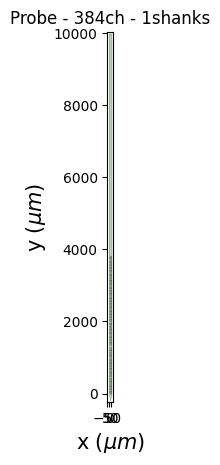

In [ ]:
# CHECK PROBE SETUP # 
# Here we make sure that probes have the correct information per subject
# Probe information is saved in .../preprocessed_data/probe_params/subject/

first_last_df = sps.get_first_last_df() # Load dataframe with info on first and last sessions per mouse
subject_IDs = first_last_df['subject_ID'].unique()
print(f'Choosing from subjects:{subject_IDs}')
# CHOOSE YOUR SUBJECT    ⬇
subject_ID = subject_IDs[0]

sps.save_rec_probe(subject_ID,
                        manufacturer = 'cambridgeneurotech',
                        probe_name = 'ASSY-236-F',
                        wiring_device='cambridgeneurotech_mini-amp-64',
                        probe_suffix = None, #'probe_A', 'probe_B' if multiple probes; do this once for each probe, for each subject
                        manual_ephys_path=None) #should handle things automatically, but included here for debugging.

Assigning channels for mEC_5
Successfully extracted probe from recording.
Assigning bad channels...
5 outside_brain channel(s) found
No noisey channels found
1 dead channel(s) found
Successfully extracted probe from recording.
Assigning bad channels...
No outside_brain channels found
No noisey channels found
1 dead channel(s) found


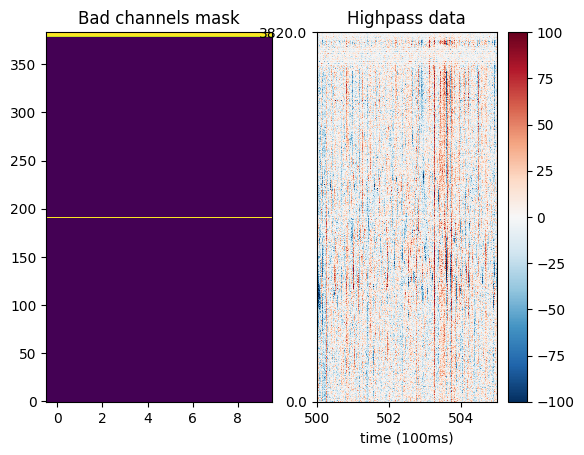

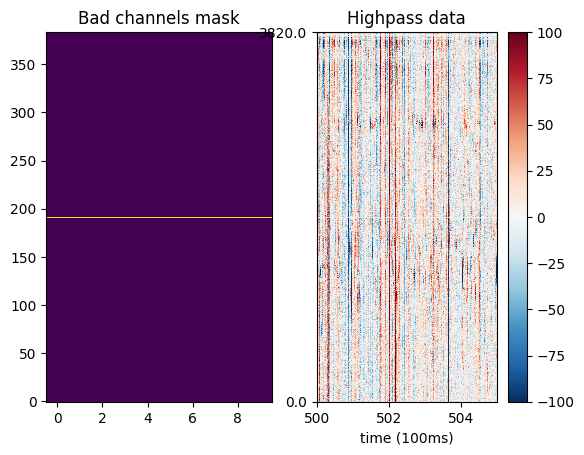

In [ ]:
# DETECT BAD CHANNELS / OUTSIDE BRAIN CHANNELS 
# SET THRESHOLD     ⬇   
outside_thresh = -0.75 #Default is -0.75, but try values between +/-0.7 in increments >= 0.05. 
n_neighbours = 11 #Default is 11, must be an odd number. If there's a missing chunk, take at least twice the missing chunk size for nyquist.

# CHOOSE SUBJECT                                  ⬇
subject_ID = first_last_df['subject_ID'].unique()[4]
print(f'Assigning channels for {subject_ID}')

#make sure there's a path for channel assignment files
assignment_path = sps.SPIKESORTING_PATH / 'probe_params'/ subject_ID 
if not assignment_path.exists():
    assignment_path.mkdir()

for index in [0,1]: #for the first and last recording of a subject
    ephys_info = first_last_df[first_last_df.subject_ID==subject_ID].iloc[index]
    raw_recs, preprocessed_paths = sps.get_probe_recordings(ephys_info.subject_ID, 
                                                               ephys_info.datetime.isoformat(), 
                                                               ephys_info.ephys_path)
    for raw_rec, preprocessed_path in zip(raw_recs,preprocessed_paths):
        sps.get_channel_assignments(raw_rec, preprocessed_path, outside_thresh, n_neighbours, save_params=True)

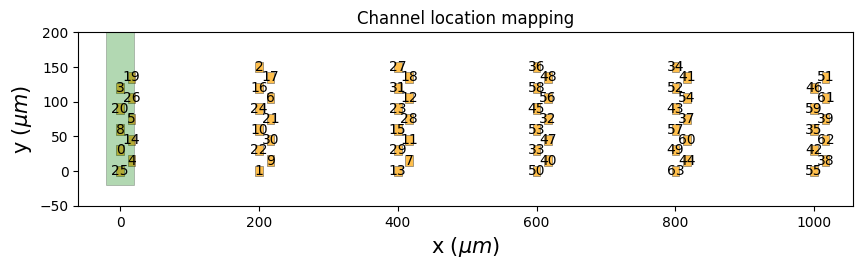

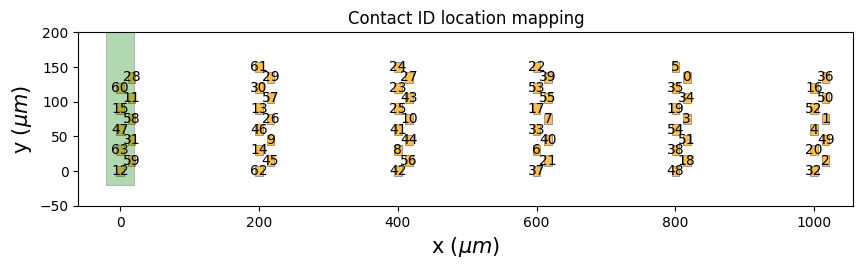

In [4]:
## SANITY CHECK ON PROBE MAPPING
#may be useful for cambridge neurotech probes 
import spikeinterface.extractors as se
import spikeinterface.full as si
from probeinterface import Probe

recording, sorting_true = se.toy_example(num_channels=64, duration=5, seed=0)

#loading a saved out cambridge neurotech probe
probe_params_path = Path('/ceph/behrens/peter_doohan/goalNav_mEC/experiment/data/preprocessed_data/spikesorting/probe_params/mEC_2/probe_A')
probe_df = pd.read_csv(probe_params_path/'probe_layout.tsv')
probe_obj = Probe.from_dataframe(probe_df)

recording = recording.set_probe(probe_obj)
fig, ax = plt.subplots(figsize=(10,15))
si.plot_probe_map(recording, with_channel_ids=True, ax= ax)
ax.set(ylim=(-50,200), title='Channel location mapping')
plt.show()

probe_obj.device_channel_indices = np.arange(64) #ignore channel mapping

recording = recording.set_probe(probe_obj)
fig, ax = plt.subplots(figsize=(10,15))
si.plot_probe_map(recording, with_channel_ids=True, ax= ax)
ax.set(ylim=(-50,200), title='Contact ID location mapping')
plt.show()

## 3 IBL pre-processing



Below we take a closer look at the pre-processing steps taken according IBL standard.
We use a 1ms snippet of data and show each step. 

1. low-cut filter (Butterworth 3rd order)
2. temporal alignment with sampling delay across channels
3. spatial filter for 'Destriping'

These steps are performed after interpolating bad channels. At this stage the data is then sent to kilosort for spike detection.

/ceph/behrens/peter_doohan/goalNav_mEC/experiment/code/SpikeSorting/optimise_kilosort.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['date'] = df_filtered['datetime'].dt.date #ignore time
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/widgets/traces.py:147: UserWarning: You have selected a time after the end of the segment. The range will be clipped to 0.0033333333333333335
  warnings.warn(
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/widgets/traces.py:147: UserWarning: You have selected a time after the end of the segment. The range will be clipped to 0.0033333333333333335
  warnings.warn(
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/py

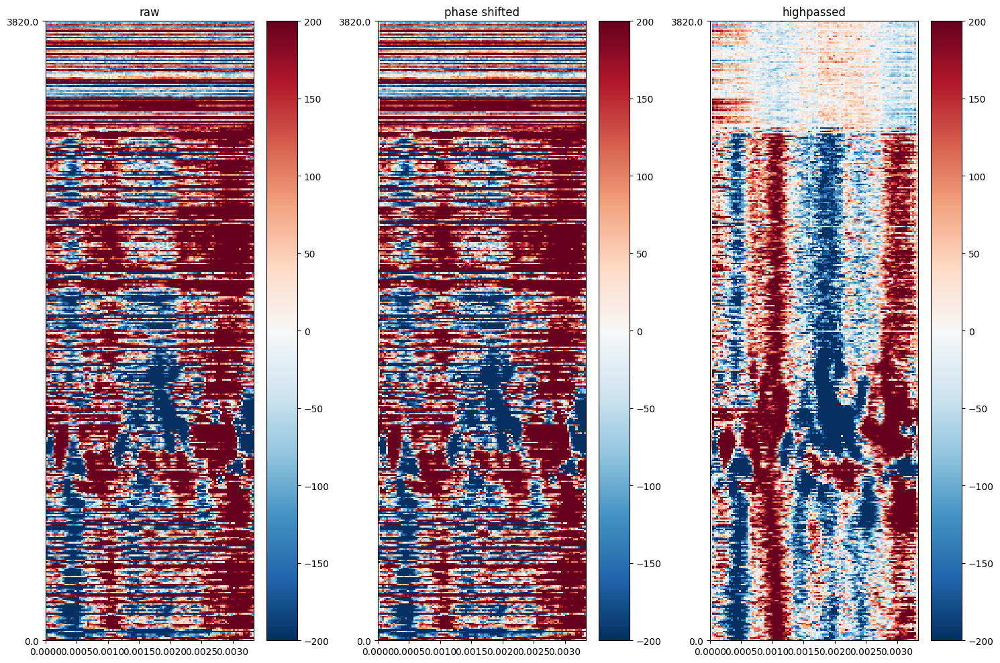

/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/widgets/traces.py:147: UserWarning: You have selected a time after the end of the segment. The range will be clipped to 0.0033333333333333335
  warnings.warn(
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/widgets/traces.py:147: UserWarning: You have selected a time after the end of the segment. The range will be clipped to 0.0033333333333333335
  warnings.warn(


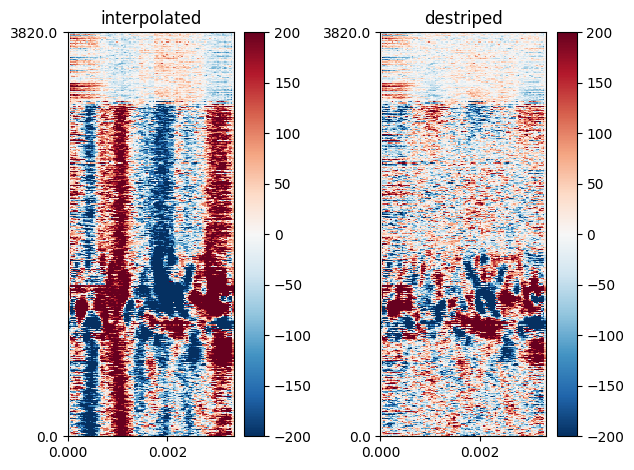

In [283]:
# import a few spikeinterface modules
from spikeinterface import extractors as se
from spikeinterface import preprocessing as sp
from spikeinterface import widgets as sw

first_last_df = ok.get_sample_paths_df()
ephys_info = first_last_df.iloc[0]
raw_rec = se.read_openephys(ephys_info.ephys_path, stream_id="0")

# keep a very short recording snippet
fs = raw_rec.sampling_frequency
length_in_seconds = 100/fs
raw = raw_rec.frame_slice(start_frame=int(fs * length_in_seconds), end_frame=int(fs * length_in_seconds*2))
# phase shift to account for timing differences
phase_shifted = sp.phase_shift(raw)
# perform highpass filtering
highpassed = sp.highpass_filter(phase_shifted) 
# remove and interpolate dead channels or channels outside the brain
preprocessed_path = sps.SPIKESORTING_PATH/ephys_info.subject_ID/ephys_info.datetime.isoformat()
with open(str(preprocessed_path/'channel_assignments.json'),'r') as j:
    channel_assignments = json.loads(j.read())
outside_brain_channels = [k for k, v in channel_assignments.items() if v == "out"]
#if len(outside_brain_channels) > 0:
#    preprocessed_rec = highpassed.remove_channels(outside_brain_channels)
#else:
#    outside_brain_channels = None

#try skipping the outside channel thingy. This should lead to errors, right?
preprocessed_rec = highpassed

bad_channels = [k for k, v in channel_assignments.items() if v in ["noise", "dead",]]
if len(bad_channels) > 0:
    interpolated = sp.interpolate_bad_channels(preprocessed_rec, bad_channel_ids=bad_channels)
# 4. perform destriping with a spacial filter
destriped = sp.highpass_spatial_filter(interpolated)

# First figure with basic preprocessing
fig, axs = plt.subplots(ncols=3, figsize = (15,10))
sw.plot_traces(raw, ax=axs[0])
sw.plot_traces(phase_shifted, ax=axs[1])
sw.plot_traces(highpassed, ax=axs[2])
for i,titles in enumerate(['raw','phase shifted','highpassed']):
    axs[i].set(title=f'{titles}')
fig.tight_layout()
plt.show()

#Second figure after removing bad channels:
fig, axs = plt.subplots(ncols=2)
sw.plot_traces(interpolated,ax=axs[0])
axs[0].set(title='interpolated')

sw.plot_traces(destriped,ax=axs[1])
axs[1].set(title='destriped')

fig.tight_layout()

Successfully extracted probe from recording.
Assigning bad channels...
No outside_brain channels found
No noisey channels found
1 dead channel(s) found
saving preprocessed traces (for each shank) for visual inspection


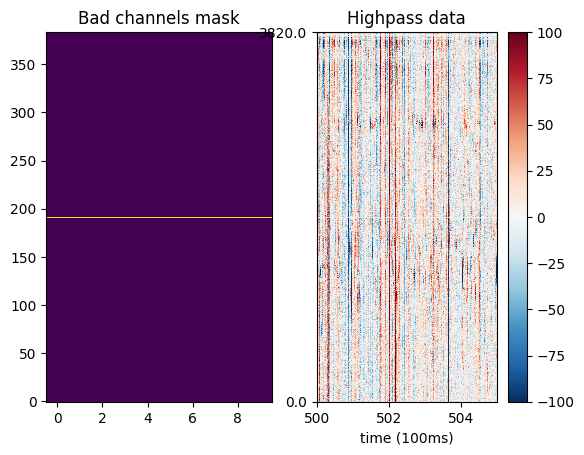

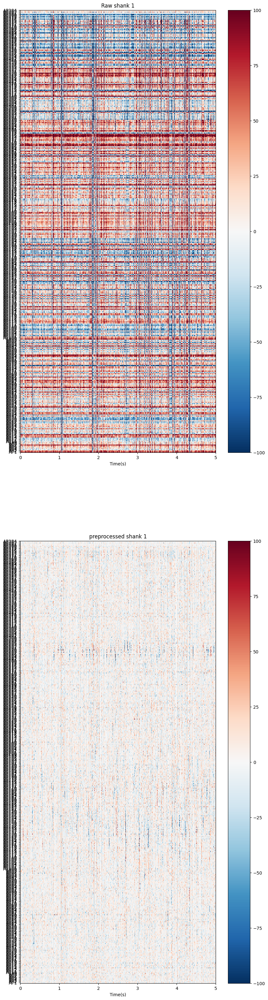

In [287]:
## Check that the overall function works 

ephys_info = first_last_df[first_last_df.subject_ID==subject_ID].iloc[index]
# We then pass the recording through some filters, and plot the channel assignments
raw_recs, preprocessed_paths = sps.get_probe_recordings(ephys_info.subject_ID, 
                                                            ephys_info.datetime.isoformat(), 
                                                            ephys_info.ephys_path)
for raw_rec, preprocessed_path in zip(raw_recs,preprocessed_paths):
    preprocessed_rec = sps.pre_kilosort_processing(raw_rec,preprocessed_path)



### 3.1 Advantages over default kilosort preprocessing

We want a quick sanity check on the advantages of using this preprocessing over standard kilosort preprocessing (all parameters default).

In [4]:
#RUN KILOSORT
#NB: here we use the recordings from the above code block.
import spikeinterface.sorters as ss

# Sorting data with default kilosort preprocessing
# create output folder
ks_pre_out = Path('./notebooks/test_kilosort/kilosort_pre')
ks_pre_out.mkdir(parents=True, exist_ok=True)
# run kilosort!
sorter_params = ss.get_default_sorter_params('kilosort4')
sorter_params["nblocks"] = 5 #Default is 1 (rigid), 5 is recommended for single shank neuropixel. This is for drift correction along probe.
sorter_params['keep_good_only'] = True # For the sake of argument, compare only good units
ks_pre_sort = ss.run_sorter('kilosort4', 
                            recording=raw,  # <=== Inputting raw data.
                            folder = ks_pre_out,
                            verbose=True,
                            remove_existing_folder=True,
                            **sorter_params)

# Sort data after IBL preprocessing
# create output folder
ibl_pre_out = Path('./notebooks/test_kilosort/IBL_pre')
ibl_pre_out.mkdir(parents=True, exist_ok=True)
ibl_preprocessed = destriped.save(format="binary",
                                  folder=ibl_pre_out/'tmp',
                                  overwrite=True)
print('saved binary- maybe Kilosort is faster now?')
# adjust a parameter before sorting:
sorter_params["do_CAR"] = False #we perform IBL destriping instead using spikeinterface
ibl_pre_sort = ss.run_sorter(
    "kilosort4",
    recording=ibl_preprocessed, # <=== This is IBL destriped.
    folder=ibl_pre_out,
    verbose=True,
    remove_existing_folder=True,
    overwrite=True,
    **sorter_params
)

INFO:kilosort.io:========================================
INFO:kilosort.io:Loading recording with SpikeInterface...
INFO:kilosort.io:number of samples: 1800000
INFO:kilosort.io:number of channels: 384
INFO:kilosort.io:numbef of segments: 1
INFO:kilosort.io:sampling rate: 30000.0
INFO:kilosort.io:dtype: int16
INFO:kilosort.io:========================================
INFO:kilosort.run_kilosort: 
INFO:kilosort.run_kilosort:Computing preprocessing variables.
INFO:kilosort.run_kilosort:----------------------------------------
INFO:kilosort.run_kilosort:N samples: 1800000
INFO:kilosort.run_kilosort:N seconds: 60.0
INFO:kilosort.run_kilosort:N batches: 30
INFO:kilosort.run_kilosort:Preprocessing filters computed in  0.41s; total  0.41s
INFO:kilosort.run_kilosort: 
INFO:kilosort.run_kilosort:Resource usage after preprocessing
INFO:kilosort.run_kilosort:********************************************************
INFO:kilosort.run_kilosort:CPU usage:     2.10 %
INFO:kilosort.run_kilosort:Memory:   

kilosort4 run time 93.05s


AssertionError: folder notebooks/test_kilosort/IBL_pre already exists, choose another name or use overwrite=True

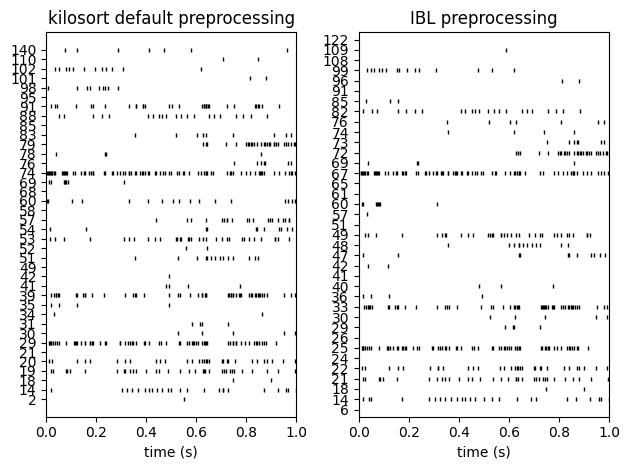

In [9]:
# basic raster comparison
from spikeinterface import widgets as sw
fig, axs = plt.subplots(ncols=2)
sw.plot_rasters(ks_pre_sort, time_range=(0,1),ax = axs[0])
axs[0].set(title='kilosort default preprocessing')
sw.plot_rasters(ibl_pre_sort, time_range=(0,1),ax = axs[1])
axs[1].set(title='IBL preprocessing')
fig.tight_layout()

In [90]:
ibl_pre_qm = sps.get_quality_metrics(sorter = ibl_pre_sort, 
                                     preprocessed_rec = destriped,
                                     preprocessed_path = ibl_pre_out,
                                     save_cluster_reports = True)

ks_pre_qm = sps.get_quality_metrics(sorter = ks_pre_sort, 
                                     preprocessed_rec = raw,
                                     preprocessed_path = ks_pre_out,
                                     save_cluster_reports = True)

estimate_sparsity:   0%|          | 0/60 [00:00<?, ?it/s]

/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/core/basesorting.py:264: UserWarning: The registered recording will not be persistent on disk, but only available in memory
  warnings.warn("The registered recording will not be persistent on disk, but only available in memory")


compute_waveforms:   0%|          | 0/60 [00:00<?, ?it/s]

calculating templates
calculating noise levels
calculating correlograms
calculating unit locations
calculating spike amplitudes


spike_amplitudes:   0%|          | 0/60 [00:00<?, ?it/s]

calculating spike locations


spike_locations:   0%|          | 0/60 [00:00<?, ?it/s]

calculating template similarity
computing quality metrics df



libgomp: Invalid value for environment variable OMP_NUM_THREADS
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:908: UserWarning: Some units have too few spikes : amplitude_cutoff is set to NaN
  warnings.warn(f"Some units have too few spikes : amplitude_cutoff is set to NaN")
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:1064: UserWarning: The recording is too short given the specified 'interval_s' and 'min_num_bins'. Drift metrics will be set to NaN
  warnings.warn(


exporting cluster reports


estimate_sparsity:   0%|          | 0/60 [00:00<?, ?it/s]

/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/core/basesorting.py:264: UserWarning: The registered recording will not be persistent on disk, but only available in memory
  warnings.warn("The registered recording will not be persistent on disk, but only available in memory")


compute_waveforms:   0%|          | 0/60 [00:00<?, ?it/s]

calculating templates
calculating noise levels
calculating correlograms
calculating unit locations
calculating spike amplitudes


spike_amplitudes:   0%|          | 0/60 [00:00<?, ?it/s]

calculating spike locations


spike_locations:   0%|          | 0/60 [00:00<?, ?it/s]

calculating template similarity
computing quality metrics df


/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:908: UserWarning: Some units have too few spikes : amplitude_cutoff is set to NaN
  warnings.warn(f"Some units have too few spikes : amplitude_cutoff is set to NaN")
/nfs/nhome/live/cburns/.conda/envs/maze_ephys/lib/python3.12/site-packages/spikeinterface/qualitymetrics/misc_metrics.py:1064: UserWarning: The recording is too short given the specified 'interval_s' and 'min_num_bins'. Drift metrics will be set to NaN
  warnings.warn(


exporting cluster reports


In [63]:
# GET SPIKEINTERFACE CLUSTER REPORTS
analyzer_out = Path('./notebooks/test_kilosort')
from spikeinterface import curation as sc
from spikeinterface import core as si

from spikeinterface import core as si
from spikeinterface import extractors as se
from spikeinterface import preprocessing as sp

from spikeinterface import sorters as ss
from spikeinterface import curation as sc
from spikeinterface import postprocessing as pp
from spikeinterface import qualitymetrics as qm
from spikeinterface import exporters as sx
from spikeinterface import qualitymetrics as sq

kept_spikes = []
ks_labels = []
pc_features = []
for each_sorter in ['IBL_pre','kilosort_pre']:
    sort_dir = Path('./notebooks/test_kilosort')/each_sorter/'sorter_output'
    kept_spikes.append(np.load((sort_dir/'kept_spikes.npy')))
    ks_labels.append(pd.read_csv((sort_dir/'cluster_KSLabel.tsv'),sep='\t'))
    pc_features.append(np.load((sort_dir/'pc_features.npy')))


In [66]:
ibl_pre_labels = ks_labels[0]
len(ibl_pre_labels[ibl_pre_labels['KSLabel']=='good'])

ks_pre_labels = ks_labels[1]
len(ks_pre_labels[ks_pre_labels['KSLabel']=='good'])

35

## 4. Optimising kilosort



Once we've assigned our channels, we are ready to denoise our data and run kilosort.

This is done at the session level with a single function.

There are two parameters which are worth tuning according to Kilosort4 docs: Th_universal and Th_learned.
These set the thresholds for inclusion of spikes later used to learn templates. 

- lowering these thresholds includes more data as putative spikes when finding waveform templates
- but this may also run the risk of including more noise, therefore favouring higher thresholds.

We therefore run kilosort with a small range of parameters and compare differences here.


In [ ]:
#Run kilosort on the first and last session across
import SpikeSorting.optimise_kilosort as ok
ok.submit_jobs()

In [ ]:
#Then after the cluster is finished letting it rip, you can summarise the results
ok.summarise_results()

The first plot should give an indication of what parameters give us most units. 

Top row is for kilosort 'good' units and second row is for units which pass the IBL criteria for 'single units'.

To make sure that these units are not being selected under some biases, we plot the distributions of quality metrics.
We do this for for first session (top row) and last session (bottom row).

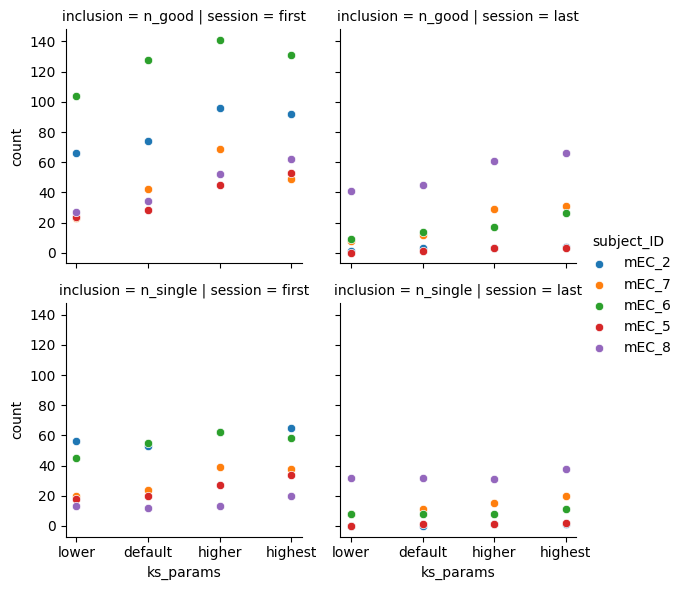

In [5]:
optim_df = ok.get_optim_df()

optim_df['subject_ID'] = optim_df['session_path'].apply(lambda x: x.parts[-2])
optim_df['session'] = optim_df['session_path'].apply(lambda x: 'first' if x.parts[-1][:7]=='2024-02' else 'last')

n_good = []
n_single = []
for each_session in optim_df['session_path']:
    ks_labels = sps.pd.read_csv(each_session/'kilosort4'/'sorter_output'/'cluster_KSLabel.tsv', sep='\t')
    good_clusters = ks_labels[ks_labels.KSLabel=='good']
    n_good.append(len(good_clusters))
    qual_df = sps.pd.read_csv(each_session/'quality_metrics.htsv', sep='\t')
    single_units = sps.get_single_units(qual_df)
    n_single.append(len(single_units))

optim_df['n_good'] = n_good
optim_df['n_single'] = n_single
plot_df = optim_df.melt(id_vars=['session_path','ks_params','subject_ID','session'],
            value_vars=['n_good','n_single'], var_name='inclusion', value_name='count')

import seaborn as sns
g = sns.FacetGrid(plot_df, col='session', row='inclusion', hue='subject_ID')
g.map(sns.scatterplot, "ks_params", "count")
g.add_legend()


### 4.1 cluster reports

### Excluded units ('good' but not 'single')

104 good clusters, 59 of which are excluded and plotted below:


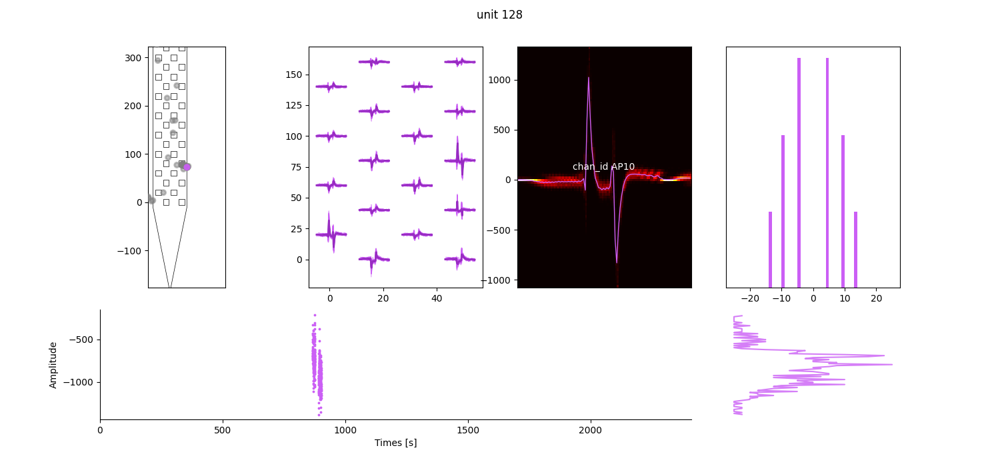

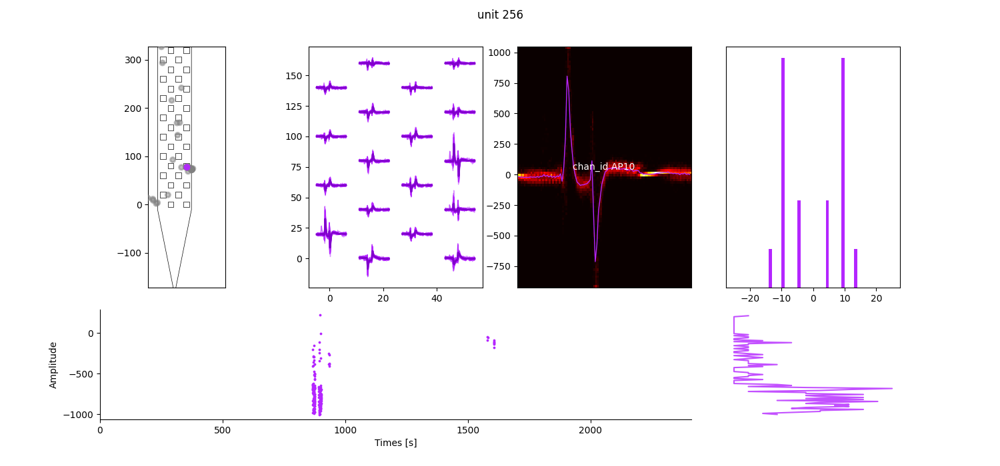

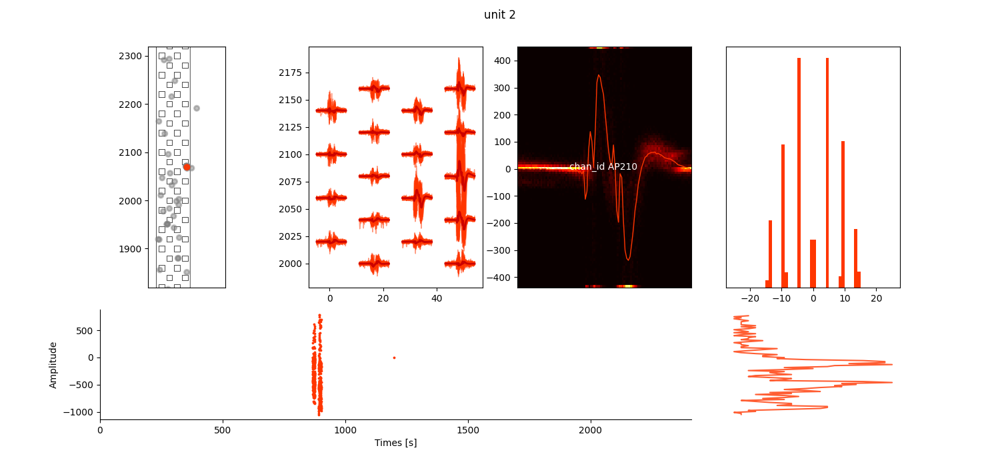

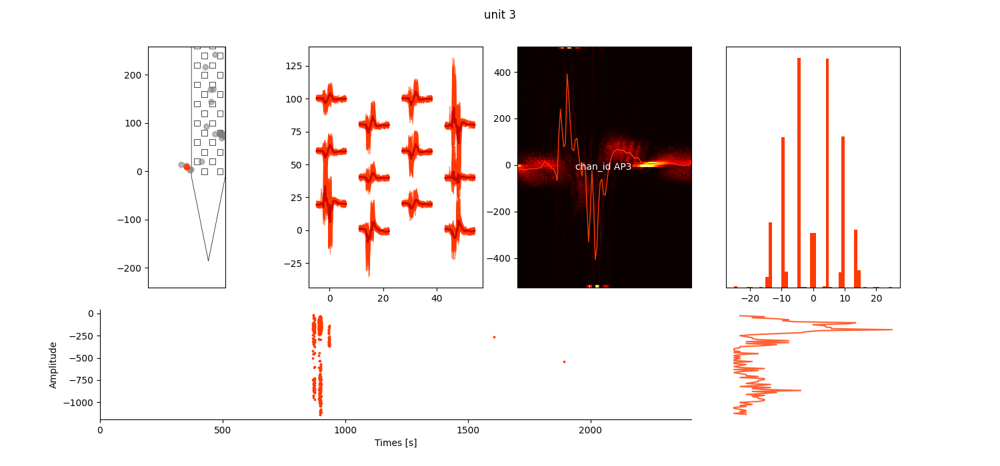

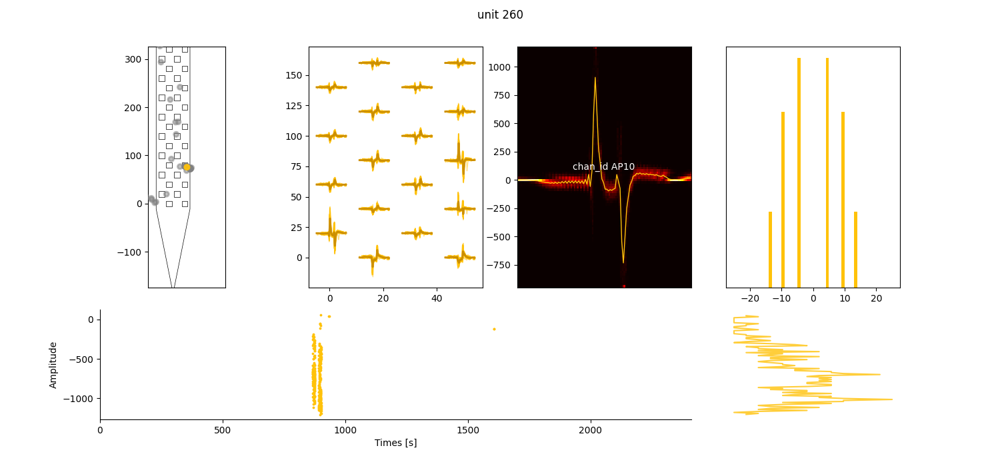

...

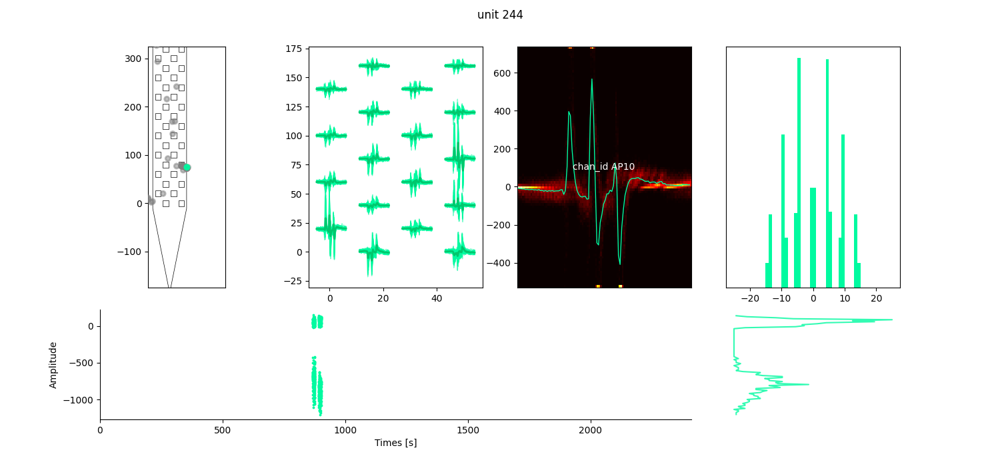

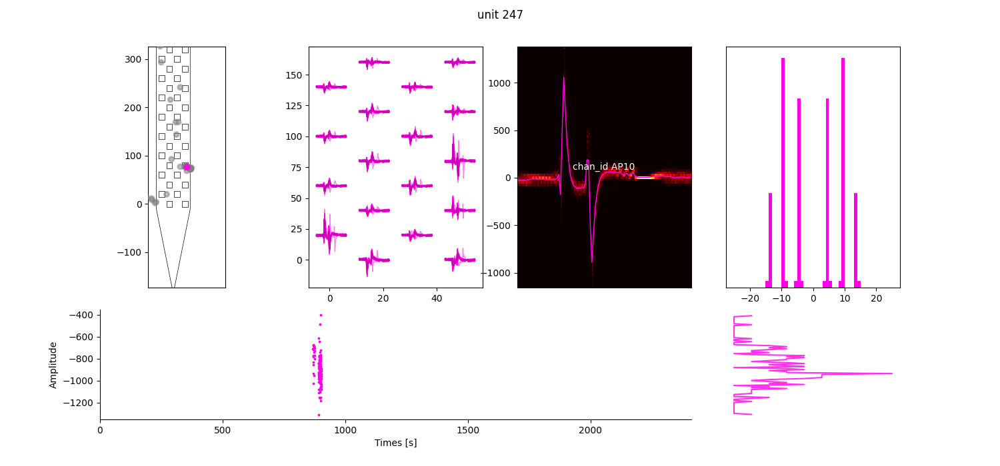

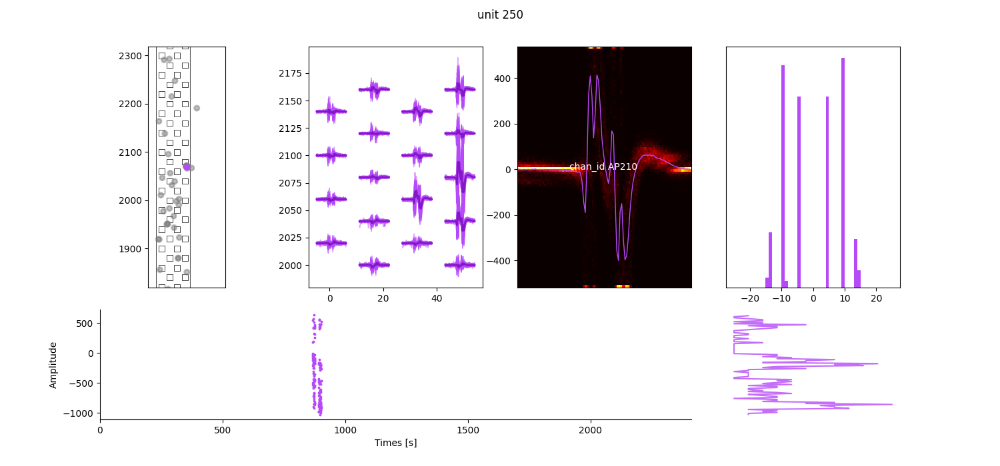

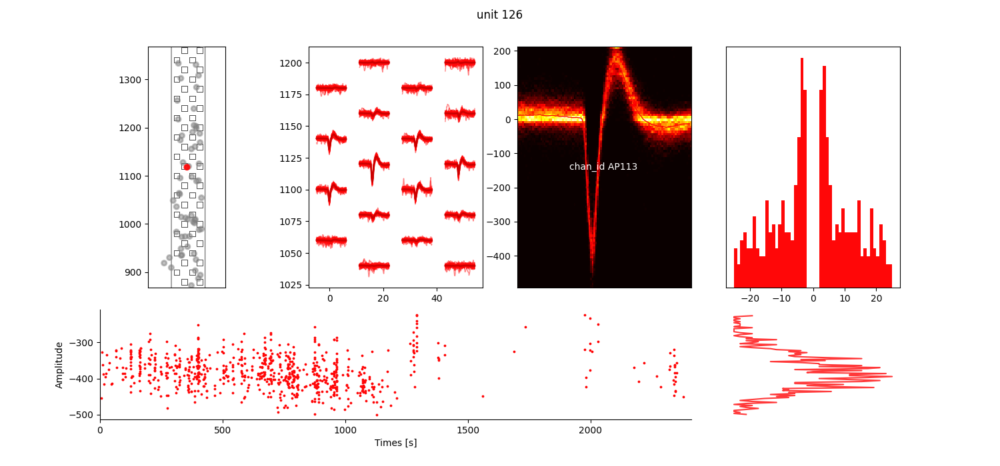

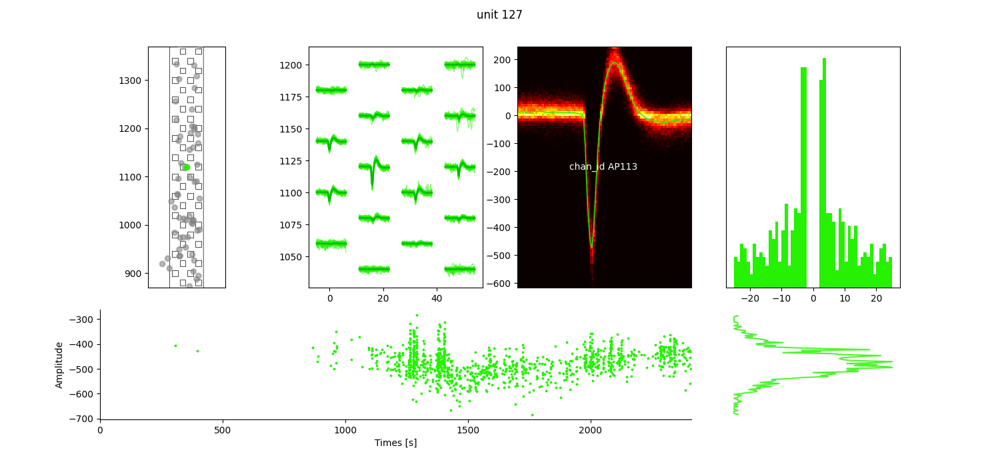

In [9]:
# Look at an example session cluster metric and kilosort labels. 
session_path = optim_df.iloc[5].session_path
cluster_metrics_df = sps.pd.read_csv((session_path/'quality_metrics.htsv'), sep='\t')
single_units = sps.get_single_units(cluster_metrics_df)

ks_labels = sps.pd.read_csv(session_path/'kilosort4'/'sorter_output'/'cluster_KSLabel.tsv', sep='\t')
good_clusters = ks_labels[ks_labels.KSLabel=='good']
excluded_clusters = list(set(good_clusters['cluster_id'])-set(single_units))

print(f'{len(good_clusters)} good clusters, {len(excluded_clusters)} of which are excluded and plotted below:')
for each_cluster in excluded_clusters:
    display(Image(session_path/'cluster_reports'/'units'/f'{each_cluster}.png'))

### Single units

20 single units plotted below:


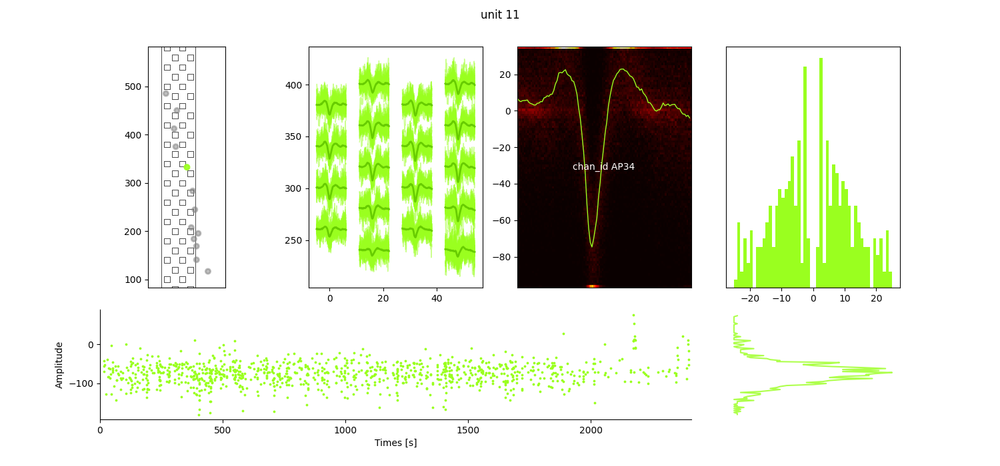

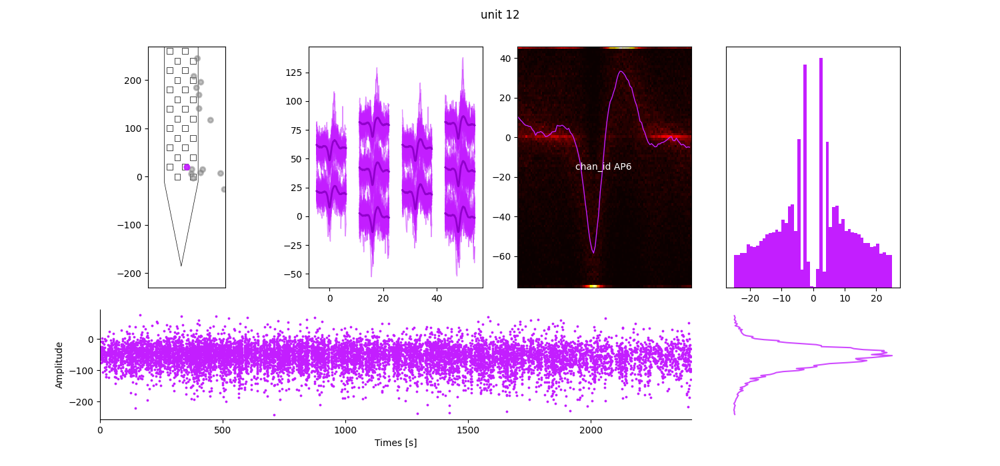

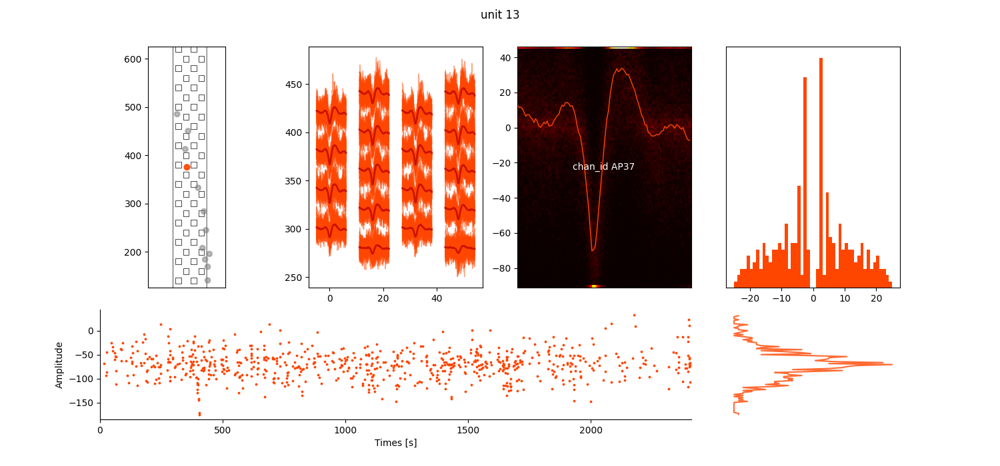

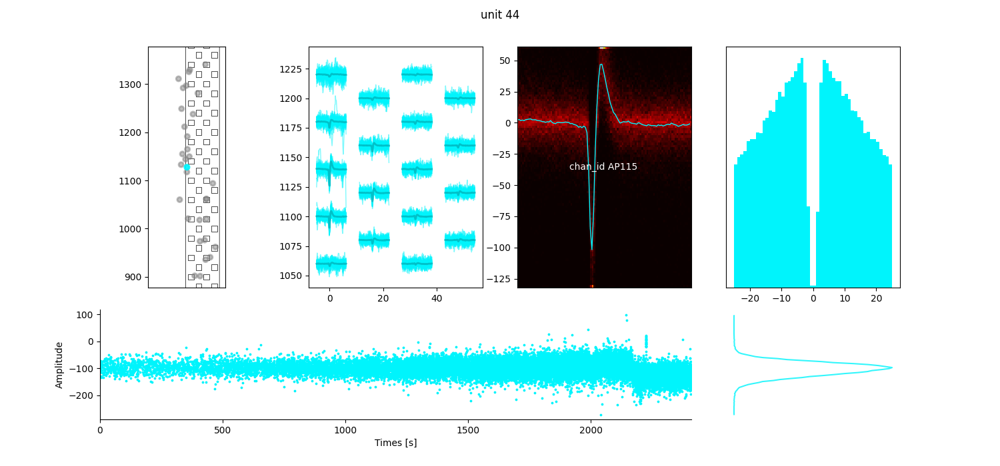

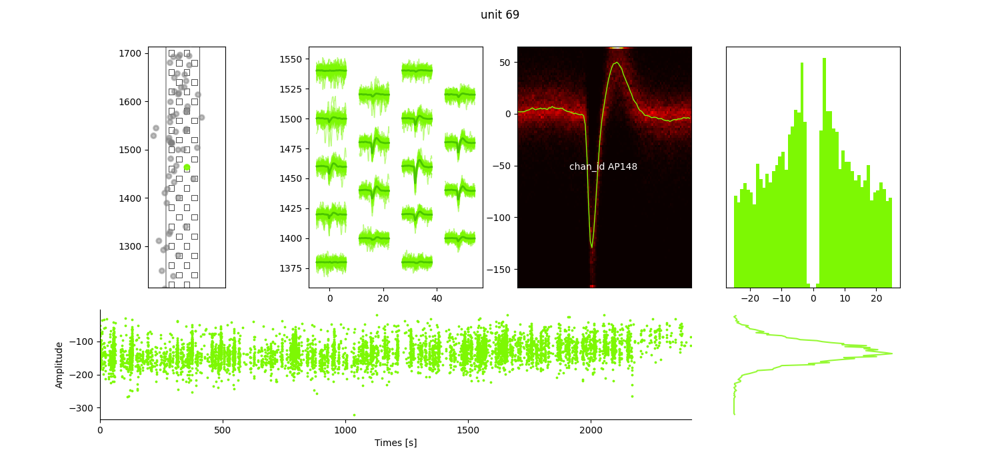

...

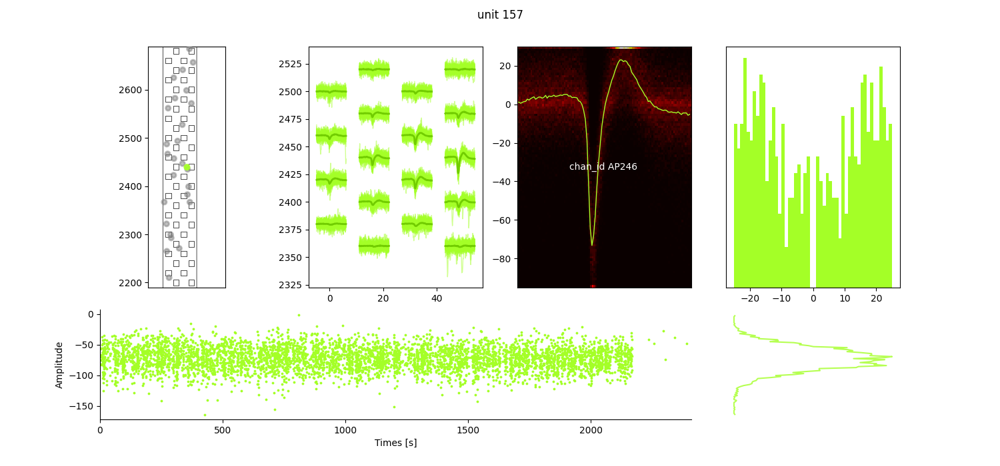

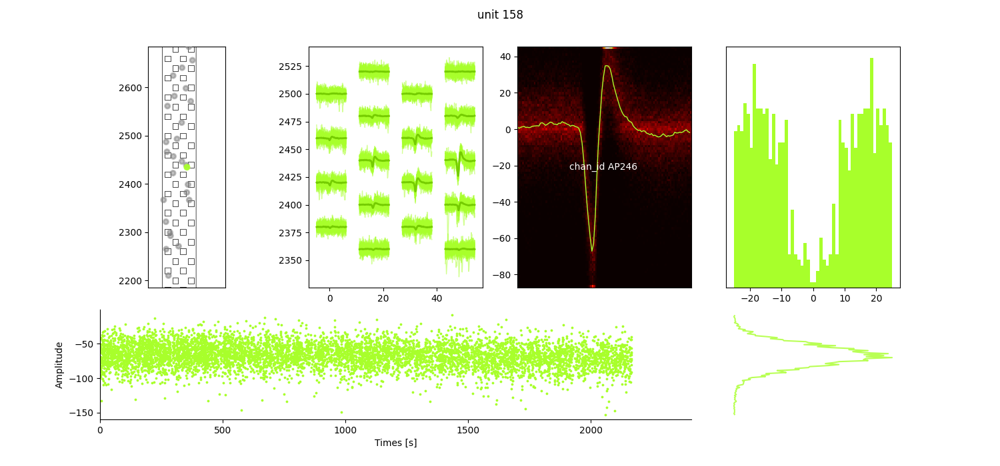

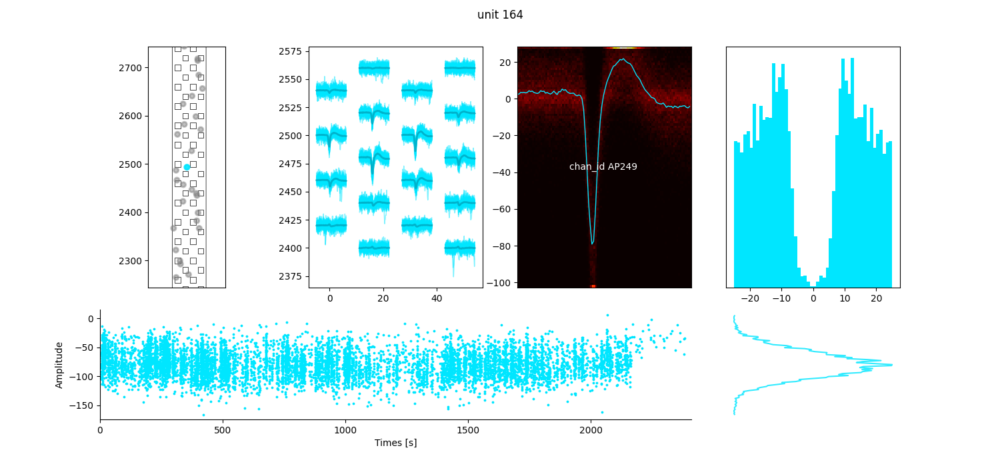

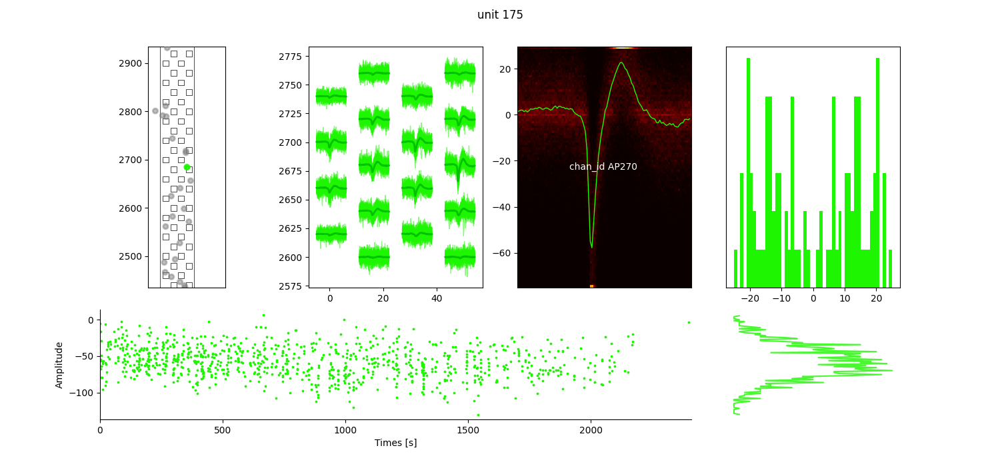

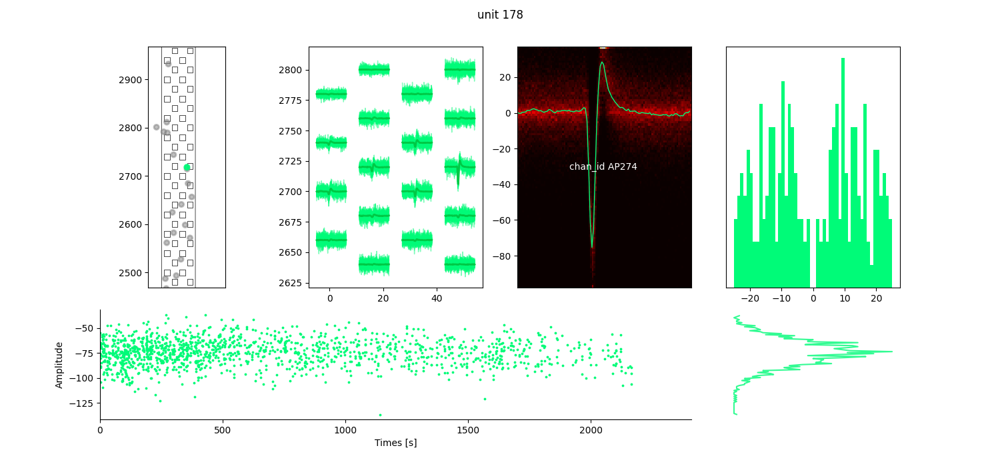

In [10]:
## Plotting 'single' units
# Look at an example session cluster metric and kilosort labels. 
session_path = optim_df.iloc[39].session_path
cluster_metrics_df = sps.pd.read_csv((session_path/'quality_metrics.htsv'), sep='\t')
single_units = sps.get_single_units(cluster_metrics_df)

ks_labels = sps.pd.read_csv(session_path/'kilosort4'/'sorter_output'/'cluster_KSLabel.tsv', sep='\t')
good_clusters = ks_labels[ks_labels.KSLabel=='good']
excluded_clusters = list(set(good_clusters['cluster_id'])-set(single_units))

print(f'{len(single_units)} single units plotted below:')
for each_cluster in single_units:
    display(Image(session_path/'cluster_reports'/'units'/f'{each_cluster}.png'))

## 5. Identifying cells across sessions



One of the primary aims is to identify and track grid-cell representations on the maze.
This requires identifying the possible pairs across sessions.

In [3]:
#First we identify all the sessions of a subject that have been kilosorted:
mec2_df = um.get_pairs_df(subject='mEC_2')
#We also check that unitmatch has run.

Excluded 22 sessions across all subjects due to no good units


In [4]:
len(mec2_df)

5253

In [2]:
sps.get_ephys_paths_df()['subject_ID'].unique()

array(['mEC_2', 'mEC_7', 'mEC_6', 'mEC_5', 'mEC_8'], dtype=object)

In [3]:
mec2_df = um.get_pairs_df(subject='mEC_5')
um.run_pairwise_unit_match(mec2_df)

KeyboardInterrupt: 

In [21]:
print(f'Completion rate: {mec5_df['completed_reports'].mean()}')
failed_df = mec5_df.query('completed_UM==False')

idx = 0
error_msg = failed_df['UM_out_path'].iloc[idx]/'failed_unitmatch.txt'

print(open(error_msg, 'r').read())



Completion rate: 0.0


FileNotFoundError: [Errno 2] No such file or directory: '../data/preprocessed_data/UnitMatch/mEC_5/2024-04-02T10:28:21x2024-03-15T11:25:34/failed_unitmatch.txt'

## Debugging UnitMatch

In [50]:
failed_df.iloc[idx].datetime1

'2024-04-02T10:28:21'

In [51]:
##DEBUGGING

import UnitMatchPy.bayes_functions as bf
import UnitMatchPy.utils as util
import UnitMatchPy.overlord as ov
import numpy as np
import matplotlib.pyplot as plt
import UnitMatchPy.save_utils as su
import UnitMatchPy.GUI as gui
import UnitMatchPy.assign_unique_id as aid
import UnitMatchPy.default_params as default_params

#query = mec2_df.query('completed_UM == False').iloc[1]
subject = 'mEC_2'
datetime1 = failed_df.iloc[idx].datetime1 #query['datetimes'][0]
datetime2 = failed_df.iloc[idx].datetime2 #query['datetimes'][1]
#datetime3 = '2024-02-20T14:22:35'

#Setting up paths
#all_session_paths = query['UM_input_paths']
#UM_out_path = query['UM_out_path']
all_session_paths = [sps.SPIKESORTING_PATH/subject/datetime1/'UM_inputs',
                     sps.SPIKESORTING_PATH/subject/datetime2/'UM_inputs'] 
UM_out_path = sps.SPIKESORTING_PATH.parent/subject/f'{datetime1}x{datetime2}'
UM_out_path.mkdir(parents=True,exist_ok=True)

# default of Spikeinterface as by default spike interface extracts waveforms in a different manner.
param = {'SpikeWidth': 90, 'waveidx': np.arange(20,50), 'PeakLoc': 35} #it's neuropixel 1.0
param = default_params.get_default_param()
param['session_paths'] = all_session_paths
param['no_shanks'] = 1 #it's a neuropixel 1.0 probe
param['shank_dist'] = 175

wave_paths, unit_label_paths, channel_pos = util.paths_from_KS(all_session_paths)
print('reading Raw waveform data')
waveform, session_id, session_switch, within_session, good_units, param = util.load_good_waveforms(wave_paths, unit_label_paths, param, 
                                                    good_units_only = True) 

#param['peak_loc'] = #may need to set as a value if the peak location is NOT ~ half the spike width

# create clus_info, contains all unit id/session related info
clus_info = { 'session_switch' : session_switch, 
            'session_id' : session_id, 
            'original_ids' : np.concatenate(good_units) }

#Extract parameters from waveform
extracted_wave_properties = ov.extract_parameters(waveform, channel_pos, clus_info, param)

total_score, candidate_pairs, scores_to_include, predictors  = ov.extract_metric_scores(extracted_wave_properties, session_switch, within_session, param, niter  = 2)

#Probability analysis
prior_match = 1 - (param['n_expected_matches'] / param['n_units']**2 ) # freedom of choose in prior prob
priors = np.array((prior_match, 1-prior_match))

labels = candidate_pairs.astype(int)
cond = np.unique(labels)
score_vector = param['score_vector']
parameter_kernels = np.full((len(score_vector), len(scores_to_include), len(cond)), np.nan)

parameter_kernels = bf.get_parameter_kernels(scores_to_include, labels, cond, param, add_one = 1)

probability = bf.apply_naive_bayes(parameter_kernels, priors, predictors, param, cond)

output_prob_matrix = probability[:,1].reshape(param['n_units'],param['n_units'])

util.evaluate_output(output_prob_matrix, param, within_session, session_switch, match_threshold = 0.75)

output_threshold = np.zeros_like(output_prob_matrix)
output_threshold[output_prob_matrix > 0.75] = 1 #

matches = np.argwhere( ((output_threshold * within_session)) == True) #exclude within session matches
UIDs = aid.assign_unique_id(output_prob_matrix, param, clus_info)
su.save_to_output(UM_out_path, scores_to_include, matches, output_prob_matrix, 
                extracted_wave_properties['avg_centroid'], 
                extracted_wave_properties['avg_waveform'],
                extracted_wave_properties['avg_waveform_per_tp'], 
                extracted_wave_properties['max_site'],
                total_score, output_threshold, clus_info, param, UIDs = UIDs, 
                matches_curated = None, save_match_table = True) #options

Using cluster_group.tsv
Using cluster_group.tsv
reading Raw waveform data


No pairs across sessions to perform drift correction.
0.9046653144016227
Calculating the probability distributions of the metric scores
Calculating the match probabilities
The percentage of units matched to themselves is: 84.44444444444444%
The percentage of false -ve's then is: 15.555555555555557% 

The rate of miss-match(es) per expected match 0.2
The percentage of false +ve's is 0.0% for session 1
The percentage of false +ve's is 0.5226480836236934% for session 2

This assumes that the spike sorter has made no mistakes
Number of Liberal Matches: 2
Number of Intermediate Matches: 2
Number of Conservative Matches: 2


In [32]:
pair = {'UM_out_path':UM_out_path,
        'preprocessed_paths':[sps.SPIKESORTING_PATH/subject/datetime1,
                              sps.SPIKESORTING_PATH/subject/datetime2],
        'datetmies':[datetime1,datetime2]}
um.get_unitmatch_reports(pair)

reading unitmatch outputs for reports
No matches across sessions


In [ ]:
## Debugging when |prior_match >1|
#Example case:
subject = 'mEC_2'
datetime1 = '2024-04-02T10:28:21' 
datetime2 = '2024-02-25T09:34:17' 
#Setting up paths
all_session_paths = [sps.SPIKESORTING_PATH/subject/datetime1/'UM_inputs',
                     sps.SPIKESORTING_PATH/subject/datetime2/'UM_inputs'] 
UM_out_path = sps.SPIKESORTING_PATH.parent/subject/f'{datetime1}x{datetime2}'
UM_out_path.mkdir(parents=True,exist_ok=True)

##Here there are no pairs across sessions, so drift correction added nan everywhere
#FIX: do not apply drift correction when there are no matches across sessions.


## Debugging 'too many indices for array: array is 1-dimensional, but 2 were indexed'

#Example case:


In [130]:
#get within day matches
from datetime import datetime as dt
pairs_df = um.get_pairs_df('mEC_2')
pairs_df['dates'] = pairs_df['datetimes'].apply(lambda x: 
    [dt.fromisoformat(x[0]).date(),dt.fromisoformat(x[1]).date()])

pairs_df['date1'] = pairs_df['dates'].apply(lambda x: x[0])
pairs_df['date2'] = pairs_df['dates'].apply(lambda x: x[1])

within_days = pairs_df.query('date1==date2 and datetime1!=datetime2')

um.unit_match_sessions(within_days['UM_input_paths'].iloc[2])

Excluded 22 sessions due to no good units
Using cluster_group.tsv
Using cluster_group.tsv
reading Raw waveform data


/ceph/behrens/peter_doohan/goalNav_mEC/experiment/code2/UnitMatch/UnitMatchPy/UnitMatchPy/metric_functions.py:326: RuntimeWarning: invalid value encountered in divide
  ang = np.abs( x1[dim_id1,:,:,:,:] - x2[dim_id1,:,:,:,:]) / np.abs(x1[dim_id2,:,:,:,:] - x2[dim_id2,:,:,:,:])


Calculating the probability distributions of the metric scores
Calculating the match probabilities
The percentage of units matched to themselves is: 88.32116788321169%
The percentage of false -ve's then is: 11.678832116788314% 

The rate of miss-match(es) per expected match 0.2773722627737226
The percentage of false +ve's is 0.331225534477567% for session 1
The percentage of false +ve's is 0.5387205387205387% for session 2

This assumes that the spike sorter has made no mistakes
Number of Liberal Matches: 63
Number of Intermediate Matches: 40
Number of Conservative Matches: 40
Completed Unitmatch. Saved outputs to: ../data/preprocessed_data/UnitMatch/mEC_2/2024-02-21T10:41:03x2024-02-21T09:53:16


In [172]:
#Probability analysis
prior_match = 1 - (param['n_expected_matches'] / param['n_units']**2 ) # freedom of choose in prior prob
priors = np.array((prior_match, 1-prior_match))

labels = candidate_pairs.astype(int)
cond = np.unique(labels)
score_vector = param['score_vector']
parameter_kernels = np.full((len(score_vector), len(scores_to_include), len(cond)), np.nan)

parameter_kernels = bf.get_parameter_kernels(scores_to_include, labels, cond, param, add_one = 1)

probability = bf.apply_naive_bayes(parameter_kernels, priors, predictors, param, cond)

output_prob_matrix = probability[:,1].reshape(param['n_units'],param['n_units'])

util.evaluate_output(output_prob_matrix, param, within_session, session_switch, match_threshold = 0.75)

output_threshold = np.zeros_like(output_prob_matrix)
output_threshold[output_prob_matrix > 0.75] = 1 #might want to set match threshold to something other than 0.75.


Calculating the probability distributions of the metric scores
Calculating the match probabilities
The percentage of units matched to themselves is: 87.29281767955801%
The percentage of false -ve's then is: 12.707182320441987% 

The rate of miss-match(es) per expected match 0.27071823204419887
The percentage of false +ve's is 0.3074044373162256% for session 1
The percentage of false +ve's is 0.29741477922672155% for session 2

This assumes that the spike sorter has made no mistakes


# general Debugging

In [6]:
probe_params_dir = Path('../data/preprocessed_data/spikesorting/probe_params')
arrays = []
for each_file in os.listdir(probe_params_dir):
    print(each_file)
    arrays.append(np.load(probe_params_dir/f'{each_file}'))

group.npy
inter_sample_shift.npy
contact_vector.npy
location.npy


In [50]:

import numpy as np
from probeinterface import Probe, get_probe

probe = get_probe(manufacturer='cambridgeneurotech',
                  probe_name = 'ASSY-236-F' )

probe = get_probe(manufacturer='cambridgeneurotech',
                  probe_name = 'ASSY-236-P-1' )
#(SPIKESORTING_PATH/'probe_params').mkdir
#np.save(SPIKESORTING_PATH/"probe_params"/'location.npy',probe.contact_positions)
#np.save(SPIKESORTING_PATH/"probe_params"/'group.npy',probe.shank_ids)

In [51]:
probe.contact_positions
probe.shank_ids

array(['3', '3', '3', '3', '3', '2', '2', '2', '1', '1', '1', '0', '0',
       '0', '0', '0', '3', '2', '3', '2', '3', '2', '2', '1', '1', '1',
       '1', '1', '0', '1', '0', '0', '3', '2', '3', '2', '3', '2', '2',
       '2', '2', '1', '1', '1', '1', '1', '0', '0', '3', '3', '3', '3',
       '3', '2', '2', '2', '1', '1', '0', '0', '0', '0', '0', '0'],
      dtype='<U1')

In [45]:
probe.to_dataframe()

,x,y,contact_shapes,width,height,shank_ids,contact_ids
0,216.5,15.0,rect,11.0,15.0,1,1
1,416.5,45.0,rect,11.0,15.0,2,2
2,216.5,135.0,rect,11.0,15.0,1,3
3,416.5,75.0,rect,11.0,15.0,2,4
4,216.5,105.0,rect,11.0,15.0,1,5
...,...,...,...,...,...,...,...
59,600.0,120.0,rect,11.0,15.0,3,60
60,800.0,150.0,rect,11.0,15.0,4,61
61,600.0,90.0,rect,11.0,15.0,3,62
62,800.0,30.0,rect,11.0,15.0,4,63


In [10]:
arrays[3]

array([[  16.,    0.],
       [  48.,    0.],
       [   0.,   20.],
       [  32.,   20.],
       [  16.,   40.],
       [  48.,   40.],
       [   0.,   60.],
       [  32.,   60.],
       [  16.,   80.],
       [  48.,   80.],
       [   0.,  100.],
       [  32.,  100.],
       [  16.,  120.],
       [  48.,  120.],
       [   0.,  140.],
       [  32.,  140.],
       [  16.,  160.],
       [  48.,  160.],
       [   0.,  180.],
       [  32.,  180.],
       [  16.,  200.],
       [  48.,  200.],
       [   0.,  220.],
       [  32.,  220.],
       [  16.,  240.],
       [  48.,  240.],
       [   0.,  260.],
       [  32.,  260.],
       [  16.,  280.],
       [  48.,  280.],
       [   0.,  300.],
       [  32.,  300.],
       [  16.,  320.],
       [  48.,  320.],
       [   0.,  340.],
       [  32.,  340.],
       [  16.,  360.],
       [  48.,  360.],
       [   0.,  380.],
       [  32.,  380.],
       [  16.,  400.],
       [  48.,  400.],
       [   0.,  420.],
       [  3

In [ ]:
import SpikeSorting.run_ephys_preprocessing as run_e
run_e.run_ephys_preprocessing()

In [59]:
df = sps.get_ephys_paths_df()
df

,subject_ID,datetime,ephys_path,spike_sorting_completed,spike_interface_readable,duration_min
0,mEC_2,2024-04-02 10:28:21,../data/raw_data/ephys/mEC_2/2024-04-02_10-28-21,True,True,40.232016
1,mEC_2,2024-02-21 10:41:03,../data/raw_data/ephys/mEC_2/2024-02-21_10-41-03,True,True,40.730847
2,mEC_2,2024-04-01 11:16:12,../data/raw_data/ephys/mEC_2/2024-04-01_11-16-12,True,True,40.145527
3,mEC_2,2024-03-13 11:16:28,../data/raw_data/ephys/mEC_2/2024-03-13_11-16-28,True,True,30.223200
4,mEC_2,2024-03-18 11:13:56,../data/raw_data/ephys/mEC_2/2024-03-18_11-13-56,True,True,30.030300
...,...,...,...,...,...,...
706,mEC_8,2024-03-24 15:58:53,../data/raw_data/ephys/mEC_8/2024-03-24_15-58-53,True,True,40.091060
707,mEC_8,2024-03-15 17:48:20,../data/raw_data/ephys/mEC_8/2024-03-15_17-48-20,True,True,30.046680
708,mEC_8,2024-03-10 17:51:58,../data/raw_data/ephys/mEC_8/2024-03-10_17-51-58,True,True,40.318593
709,mEC_8,2024-03-16 16:19:51,../data/raw_data/ephys/mEC_8/2024-03-16_16-19-51,True,True,30.072467


In [54]:
## There's an issue with pre-processing and duplicate files.
# The main fix should be in sps.get_stream_id().
from datetime import datetime as dt
# here we attempt to identify and fix it

from pathlib import Path
from collections import defaultdict

def find_multiple_recordings(base_path):
    multiple_recording_paths = []
    base_path = Path(base_path)
    
    # Traverse through subject and datetime directories
    for subject_dir in base_path.iterdir():
        if subject_dir.is_dir():
            for datetime_dir in subject_dir.iterdir():
                if datetime_dir.is_dir():
                    # Record path up to datetime for storing multiple recording cases
                    datetime_path = datetime_dir.relative_to(base_path)
                    # Dictionary to track unique recordings per subject-datetime
                    recordings_count = defaultdict(int)
                    
                    # Traverse through Record Node X folders
                    for record_node_dir in datetime_dir.glob("Record Node*"):
                        continuous_dir = record_node_dir / "experiment1" / "recording1" / "continuous"
                        if continuous_dir.is_dir():
                            # Count each recording in the continuous folder
                            for recording in continuous_dir.iterdir():
                                if recording.is_dir():
                                    recordings_count[datetime_path] += 1
                    
                    # Check if there is more than one recording
                    if recordings_count[datetime_path] > 2:
                        multiple_recording_paths.append(datetime_dir)
                        
    return multiple_recording_paths

# Usage:
# Replace with the path to sps.EPHYS_PATH
multiple_recording_folders = find_multiple_recordings(sps.EPHYS_PATH)

print("Folders with multiple recordings:")
stream_ids = []
for folder in multiple_recording_folders:
    if 'mEC_5' in str(folder):
        subject = folder.parts[-2]
        datetime = dt.strptime(folder.parts[-1], "%Y-%m-%d_%H-%M-%S").isoformat()
        preprocessed_path = sps.SPIKESORTING_PATH/subject/datetime
        print(preprocessed_path)
        #os.system(f'rm -rf {preprocessed_path}/*') #DANGER DANGER !
        #print('removed')

Folders with multiple recordings:
../data/preprocessed_data/spikesorting/mEC_5/2024-04-02T10:28:21
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-01T11:16:12
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-30T11:47:29
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-08T10:50:05
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-28T11:09:38
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-25T10:15:21
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-26T11:23:12
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-24T11:05:55
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-07T11:35:56
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-14T10:54:12
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-04T10:36:46
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-03-26T10:36:19
removed
../data/preprocessed_data/spikesorting/mEC_5/2024-04-14T11:40:31
removed
../data/preproces

In [63]:
import SpikeSorting.run_ephys_preprocessing as run_e
run_e.run_ephys_preprocessing()

Submitting mEC_2 2024-03-19 11:44:24 to HPC
Submitted batch job 5679765
Submitting mEC_2 2024-03-14 10:24:28 to HPC
Submitted batch job 5679766
Submitting mEC_7 2024-03-16 13:53:06 to HPC
Submitted batch job 5679767
Submitting mEC_7 2024-03-13 14:35:34 to HPC
Submitted batch job 5679768
Submitting mEC_7 2024-02-17 16:20:51 to HPC
Submitted batch job 5679769
Submitting mEC_6 2024-02-17 14:59:05 to HPC
Submitted batch job 5679770
Submitting mEC_5 2024-04-02 10:28:21 to HPC
Submitted batch job 5679771
Submitting mEC_5 2024-04-01 11:16:12 to HPC
Submitted batch job 5679772
Submitting mEC_5 2024-04-08 10:50:05 to HPC
Submitted batch job 5679773
Submitting mEC_5 2024-03-28 11:09:38 to HPC
Submitted batch job 5679774
Submitting mEC_5 2024-03-25 10:15:21 to HPC
Submitted batch job 5679775
Submitting mEC_5 2024-03-26 11:23:12 to HPC
Submitted batch job 5679776
Submitting mEC_5 2024-04-07 11:35:56 to HPC
Submitted batch job 5679777
Submitting mEC_5 2024-04-14 10:54:12 to HPC
Submitted batch job 

chmod: changing permissions of 'SpikeSorting/jobs/slurm/ephys_preprocessing_mEC_5_2024-04-15T10:31:24_Kilosort4.sh': Operation not permitted


Submitted batch job 5679790
Submitting mEC_5 2024-03-29 12:03:01 to HPC
Submitted batch job 5679791
Submitting mEC_5 2024-04-11 11:48:10 to HPC
Submitted batch job 5679792
Submitting mEC_5 2024-03-22 10:42:32 to HPC
Submitted batch job 5679793
Submitting mEC_5 2024-03-28 12:00:33 to HPC
Submitted batch job 5679794
Submitting mEC_5 2024-04-02 11:14:49 to HPC
Submitted batch job 5679795
Submitting mEC_5 2024-04-01 12:02:01 to HPC
Submitted batch job 5679796
Submitting mEC_5 2024-04-12 10:59:07 to HPC
Submitted batch job 5679797
Submitting mEC_5 2024-03-29 11:15:21 to HPC
Submitted batch job 5679798
Submitting mEC_5 2024-04-06 11:27:20 to HPC
Submitted batch job 5679799
Submitting mEC_5 2024-04-06 10:39:21 to HPC
Submitted batch job 5679800
Submitting mEC_5 2024-03-27 11:39:44 to HPC
Submitted batch job 5679801
Submitting mEC_5 2024-04-11 11:01:26 to HPC
Submitted batch job 5679802
Submitting mEC_5 2024-03-25 11:01:44 to HPC
Submitted batch job 5679803
Submitting mEC_5 2024-04-09 10:47:15